In [2]:
# Imports
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image, ImageDraw
import numpy as np
import imutils
from tqdm import trange, tqdm
# Detect, Extract and Match Features

def detectAndDescribe(image, method=None):
    """
    Compute key points and feature descriptors using an specific method
    """
    
    assert method is not None, "You need to define a feature detection method. Values are: 'sift', 'surf'"
    
    # detect and extract features from the image
    if method == 'sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.xfeatures2d.SURF_create()
    elif method == 'brisk':
        descriptor = cv2.BRISK_create()
    elif method == 'orb':
        descriptor = cv2.ORB_create(10000)
        
    # get keypoints and descriptors
    (kps, features) = descriptor.detectAndCompute(image, None)
    
    return (kps, features)


In [3]:
def Tmatrix(img1,img2):
  M1,N1,_ = img1.shape
  T1 = np.matrix([[2/N1,0,-N1/2],[0,2/M1,-M1/2],[0,0,1]])
  M2,N2,_ = img2.shape
  T2 = np.matrix([[2/N2,0,-N2/2],[0,2/M2,-M2/2],[0,0,1]])
  return T1,T2


def generateRandom(src_Pts,T1,dest_Pts,T2,N):
    idx = np.random.choice(len(src_Pts), N)
    # print(idx)
    srcPoints = []
    destPoints = []

    for j in idx:
      srcP = np.append(src_Pts[j],1).reshape(3,1)
      srcP = T1.dot(srcP)
      srcPoints.append(srcP)
      destP = np.append(dest_Pts[j],1).reshape(3,1)
      destP = T2.dot(destP)
      destPoints.append(destP)

    return np.asarray(srcPoints, dtype=np.float32), np.asarray(destPoints, dtype=np.float32)


def hMatrix(x1,x2,T1,T2):
  w1 = w2 = 1
  # print(x1)
  Ai = []
  for idx in range(len(x1)):
    x1i,y1i,_ = [float(e) for e in x1[idx]]
    x2i,y2i,_ = [float(e) for e in x2[idx]]
    # Formula online
    # row1 = [w2*x1i,w2*y1i,w2, 0,0,0, -x2i*x1i,-x2i*y1i,-x2i]
    # row2 = [0,0,0,   w2*x1i,w2*y1i,w2,  -y2i*x1i,-y2i*y1i,-y2i]
    # Sir's formula
    row1 = [0,0,0,   -w2*x1i,-w2*y1i,-w2,  y2i*x1i,y2i*y1i,y2i]
    row2 = [w2*x1i,w2*y1i,w2, 0,0,0, -x2i*x1i,-x2i*y1i,-x2i]
    Ai.append(row1)
    Ai.append(row2)
  Ai = np.matrix(Ai)
  # Performing SVD using built-in libraries
  U,D,V = np.linalg.svd(Ai)
  # Taking last column of V
  h = V[-1]
  H_ = h.reshape(3,3)
  H = np.matmul(np.matmul(np.linalg.inv(T2),H_),T1)
  return H/H[-1,-1]

def get_coordinates(good1,kps1,kps2):
  V1 = []
  V2 = []
  # [(x1,y1), (x2,y2), (x3,y3), ...]
  for idx in good1:
    a = (kps1[idx.queryIdx].pt)
    V1.append(a)
    a = (kps2[idx.trainIdx].pt)
    V2.append(a)
  # print(V1)
  return V1,V2

def ransac(V1,V2,T1,T2):
  maxI = 0
  maxLSrc = []
  maxLDest = []
  for i in range(100):
    srcPoints,destPoints = generateRandom(V1,T1,V2,T2,4)
    # print(srcPoints)
    H = hMatrix(srcPoints,destPoints,T1,T2)
    inliers = 0
    linesSrc = []
    lineDest = []
    for p1, p2 in zip(V1, V2):
        p1U = (np.append(p1, 1)).reshape(3, 1)
        p2e = H.dot(p1U)
        p2e = (p2e / p2e[2])[:2].reshape(1, 2)
        if cv2.norm(p2 - p2e) < 20:
            inliers += 1
            norm_p1 = T1.dot(p1U)
            p2U = (np.append(p2, 1)).reshape(3, 1)
            norm_p2 = T2.dot(p2U)
            linesSrc.append(norm_p1)
            lineDest.append(norm_p2)

    if inliers > maxI:
        maxI = inliers
        maxLSrc = linesSrc.copy()
        maxLSrc = np.asarray(maxLSrc, dtype=np.float32)
        maxLDest = lineDest.copy()
        maxLDest = np.asarray(maxLDest, dtype=np.float32)

  if maxI!=0:
    # print(H1)
    H = hMatrix(maxLSrc,maxLDest,T1,T2)
    print('\nInliers: ',maxI,' out of ',len(V1),' points')
    print('Homography matrix after RANSAC\n',H)
  return H


# warping and blending
def warpBuilt(img1,img2,H):
  h1,w1,_ = img1.shape
  h2,w2,_ = img2.shape
  H_inv = np.linalg.inv(H)
  H_inv/=H_inv[-1,-1]
  print('\nH inverse\n',H_inv)
  warped_image1 = cv2.warpPerspective(img2,H_inv,(w1+w2,h1))
  warped_image1[0:h1,0:w1] = img1
  # cv2_imshow(warped_image1)
  return warped_image1


# Warping

def warping(img1,img2,H):
  h1,w1,_ = img1.shape
  h2,w2,_ = img2.shape
  # h = h1
  H_inv = np.linalg.inv(H)
  max_w = w2
  max_h = h2
  min_w = 0
  min_h = 0
  for w in trange(w2):
    for h in range(h2):
      src_point = np.array([w,h,1]).reshape(3,1)
      # print(
      # break
      dst_point = H_inv.dot(src_point)
      w_f,h_f,s_f = dst_point
      w_f = w_f.reshape(1,1)
      h_f = h_f.reshape(1,1)
      s_f = s_f.reshape(1,1)
      w_f,h_f= int(round(w_f[0,0]/s_f[0,0])),int(round(h_f[0,0]/s_f[0,0]))
      if w_f<min_w: min_w = w_f
      if w_f>max_w: max_w = w_f
      if h_f<min_h: min_h = h_f
      if h_f>max_h: max_h = h_f
      
      # warped_image
  warped_image = np.zeros((max_h-min_h+1,max_w-min_w+1,3))
  warped_image[-min_h:h1-min_h,-min_w:w1-min_w] = img1
  h_w,w_w,_ = warped_image.shape
  print(warped_image.shape)
  # try:
  for w in trange(w_w):
    for h in range(h_w):
      src_point = np.array([w,h,1]).reshape(3,1)
      dst_point = H.dot(src_point)
      w_f,h_f,s_f = dst_point
      w_f = w_f.reshape(1,1)
      h_f = h_f.reshape(1,1)
      s_f = s_f.reshape(1,1)
      w_f,h_f= int(round(w_f[0,0]/s_f[0,0]))+min_w,int(round(h_f[0,0]/s_f[0,0]))+min_h
      # w_f,h_f= int(round(w_f[0,0]/s_f[0,0])),int(round(h_f[0,0]/s_f[0,0]))
      if h_f>=h2 or h_f<0 or w_f>=w2 or w_f<0:
        continue
      warped_image[h,w]= img2[h_f,w_f]
  # cv2_imshow(warped_image)
  return warped_image


def removeBlack(image):
  gray = cv2.cvtColor(image.astype(np.float32), cv2.COLOR_BGR2GRAY)
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]
  thresh = thresh.astype(np.uint8)
  # Finds contours from the binary image
  cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)

  # get the maximum contour area
  c = max(cnts, key=cv2.contourArea)

  # get a bbox from the contour area
  (x, y, w, h) = cv2.boundingRect(c)

  # crop the image to the bbox coordinates
  image2 = image[y:y + h, x:x + w]

  # cv2_imshow(image2)
  return image2

In [4]:
# Stitcher
def stitcher(Img1,Img2,showMatch = False,showFeature=False):
  kps1,features1 = detectAndDescribe(Img1,'orb')
  kps2,features2 = detectAndDescribe(Img2,'orb')
  match = cv2.BFMatcher()
  matches = match.knnMatch(features1,features2,k=2)
  good1 = []
  for m,n in matches:
      if m.distance < 0.7*n.distance:
          good1.append(m)#.queryIdx)
  
  if showFeature:
    imgtemp = img1
    for kp in kps1:
      x,y = kp.pt
      cv2.circle(imgtemp,(int(x),int(y)),radius=1,color=(0,255,0),thickness=-1)
    cv2_imshow(imgtemp)
  
  if showMatch:
    draw_params = dict(matchColor = (0,255,0),
                      singlePointColor = None,
                      flags = 2)
    img4 = cv2.drawMatches(Img1,kps1,Img2,kps2,good1,None,**draw_params)
    cv2_imshow(img4)
  
  T1,T2 = Tmatrix(Img1,Img2)
  V1,V2 = get_coordinates(good1,kps1,kps2)
  H_ransac = ransac(V1,V2,T1,T2)
  wimg = warping(Img1,Img2,H_ransac)
  wimg = removeBlack(wimg)
  cv2_imshow(wimg)
  return wimg,H_ransac,V1,V2



In [5]:
img1 = cv2.imread('/content/drive/MyDrive/panorama_dataset/I1/STA_0031.JPG')
img2 = cv2.imread('/content/drive/MyDrive/panorama_dataset/I1/STB_0032.JPG')
img3 = cv2.imread('/content/drive/MyDrive/panorama_dataset/I1/STC_0033.JPG')
img4 = cv2.imread('/content/drive/MyDrive/panorama_dataset/I1/STD_0034.JPG')
img5 = cv2.imread('/content/drive/MyDrive/panorama_dataset/I1/STE_0035.JPG')
img6 = cv2.imread('/content/drive/MyDrive/panorama_dataset/I1/STF_0036.JPG')

In [6]:
stitch_img23,H,V1,V2 = stitcher (img2,img3)

Output hidden; open in https://colab.research.google.com to view.

In [7]:
stitch_img234,H2,V3,V4 = stitcher (np.uint8(stitch_img23),img4)

  0%|          | 1/3264 [00:00<06:36,  8.23it/s]


Inliers:  27  out of  66  points
Homography matrix after RANSAC
 [[-4.43241750e-01  7.34897699e-02  1.48053266e+03]
 [-4.23707180e-01 -2.96724133e-01  1.51516645e+03]
 [-4.00541751e-04  5.63733979e-05  1.00000000e+00]]


100%|██████████| 3264/3264 [03:51<00:00, 14.11it/s]


ValueError: ignored

In [ ]:
stitch_img2345,H3,V5,V6 = stitcher(np.uint8(stitch_img234),img5)

In [ ]:
H_builtin12,_ = cv2.findHomography(np.float32(V1),np.float32(V2),cv2.RANSAC,20)
H_builtin23,_ = cv2.findHomography(np.float32(V3),np.float32(V4),cv2.RANSAC,20)
H_builtin34,_ = cv2.findHomography(np.float32(V5),np.float32(V6),cv2.RANSAC,20)
# print('\nHomography Matrix (built-in function)\n',H_builtin12)
# np.linalg.inv(H_builtin12)#/np.linalg.inv(H_builtin)[-1,-1]

In [ ]:
# Built in Homography function output
def built_in(img1,img2,H):
  wimg = warping(img1,img2,H)
  wimg = removeBlack(wimg)
  return wimg
image1 = built_in(img1,img2,H_builtin12)
image2 = built_in(np.uint8(image1),img3,H_builtin23)
image_next = built_in(np.uint8(image2),img4,H_builtin34)
cv2_imshow(image_next)


H inverse
 [[ 7.92521984e-01  2.31692665e-02  6.19969045e+02]
 [-7.87142417e-02  9.35177929e-01  2.78657088e+00]
 [-1.09721273e-04  7.95894142e-06  1.00000000e+00]]


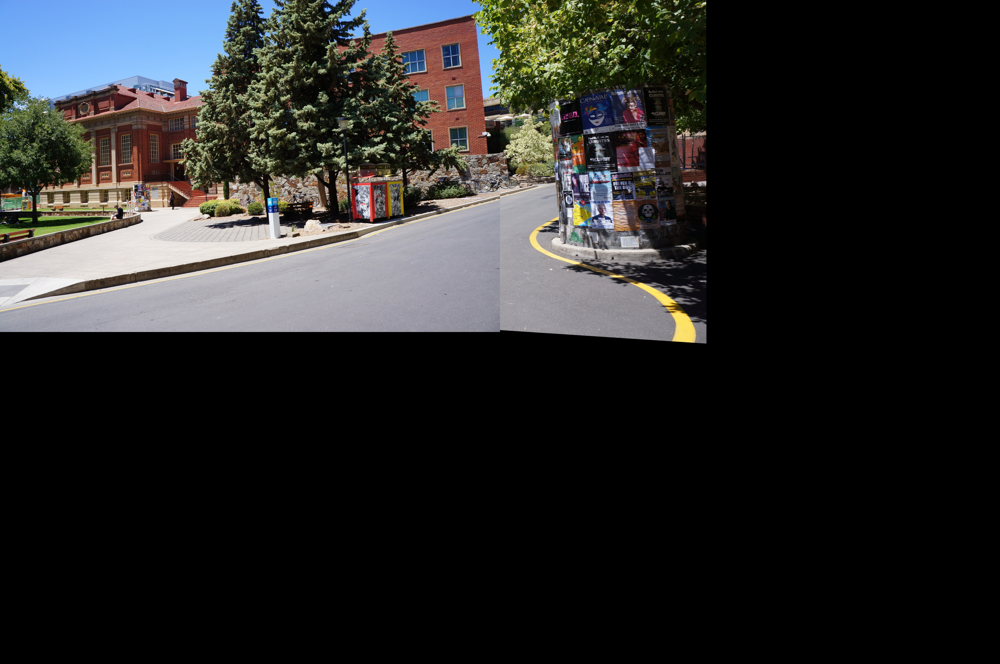

In [ ]:
# warping and blending
def warpBuilt(img1,img2,H):
  h1,w1,_ = img1.shape
  h2,w2,_ = img2.shape
  H_inv = np.linalg.inv(H)
  H_inv/=H_inv[-1,-1]
  print('\nH inverse\n',H_inv)
  warped_image1 = cv2.warpPerspective(img2,H_inv,(w1+w2,h1+h2))
  warped_image1[0:h1,0:w1] = img1
  cv2_imshow(warped_image1)
  return warped_image1
image23 = warpBuilt(img2,img3,H_builtin12)
# cv2_imshow(image23)

(480, 873, 3)


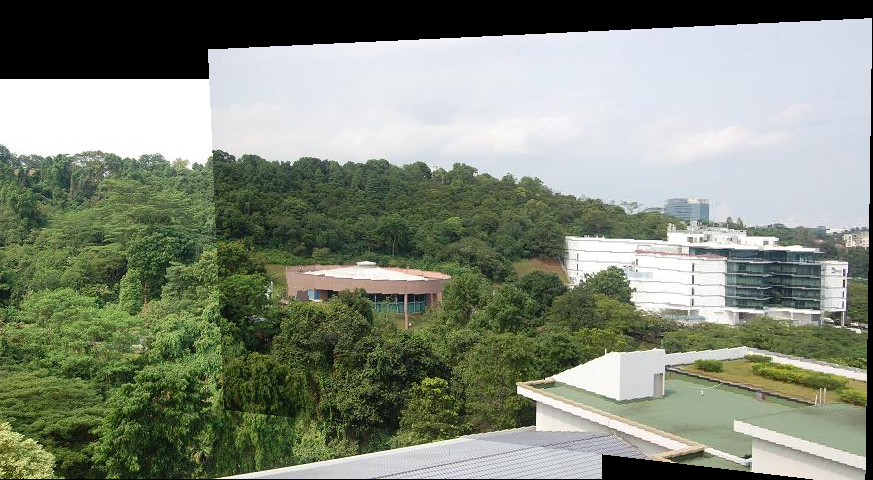

In [ ]:
# Warping

def warping(img1,img2,H):
  h1,w1,_ = img1.shape
  h2,w2,_ = img2.shape
  # h = h1
  H_inv = np.linalg.inv(H)
  max_w = w2
  max_h = h2
  min_w = 0
  min_h = 0
  for w in range(w2):
    for h in range(h2):
      src_point = np.array([w,h,1]).reshape(3,1)
      # print(
      # break
      dst_point = H_inv.dot(src_point)
      w_f,h_f,s_f = dst_point
      w_f = w_f.reshape(1,1)
      h_f = h_f.reshape(1,1)
      s_f = s_f.reshape(1,1)
      w_f,h_f= int(round(w_f[0,0]/s_f[0,0])),int(round(h_f[0,0]/s_f[0,0]))
      if w_f<min_w: min_w = w_f
      if w_f>max_w: max_w = w_f
      if h_f<min_h: min_h = h_f
      if h_f>max_h: max_h = h_f
      
      # warped_image
  warped_image = np.zeros((max_h-min_h+1,max_w-min_w+1,3))
  warped_image[-min_h:h1-min_h,-min_w:w1-min_w] = img1
  h_w,w_w,_ = warped_image.shape
  print(warped_image.shape)
  # try:
  for w in range(w_w):
    for h in range(h_w):
      src_point = np.array([w,h,1]).reshape(3,1)
      dst_point = H.dot(src_point)
      w_f,h_f,s_f = dst_point
      w_f = w_f.reshape(1,1)
      h_f = h_f.reshape(1,1)
      s_f = s_f.reshape(1,1)
      w_f,h_f= int(round(w_f[0,0]/s_f[0,0]))+min_w,int(round(h_f[0,0]/s_f[0,0]))+min_h
      # w_f,h_f= int(round(w_f[0,0]/s_f[0,0])),int(round(h_f[0,0]/s_f[0,0]))
      if h_f>=h2 or h_f<0 or w_f>=w2 or w_f<0:
        continue
      warped_image[h,w]= img2[h_f,w_f]
  # except:
  #   print(h_f,w_f)
  cv2_imshow(warped_image)
  return warped_image


warped_image = warping(img1,img2,H_builtin)

Inliers:  393  out of  405  points
Homography matrix after RANSAC
 [[ 1.38007516e+00  1.10627838e-02 -3.01654722e+02]
 [ 1.07254859e-01  1.28076105e+00 -6.13865121e+01]
 [ 5.87136816e-04  9.45811888e-05  1.00000000e+00]]

H inverse
 [[ 7.28371950e-01 -2.24153891e-02  2.18340836e+02]
 [-8.11256723e-02  8.81580074e-01  2.96451837e+01]
 [-4.19981025e-04 -7.02199913e-05  1.00000000e+00]]


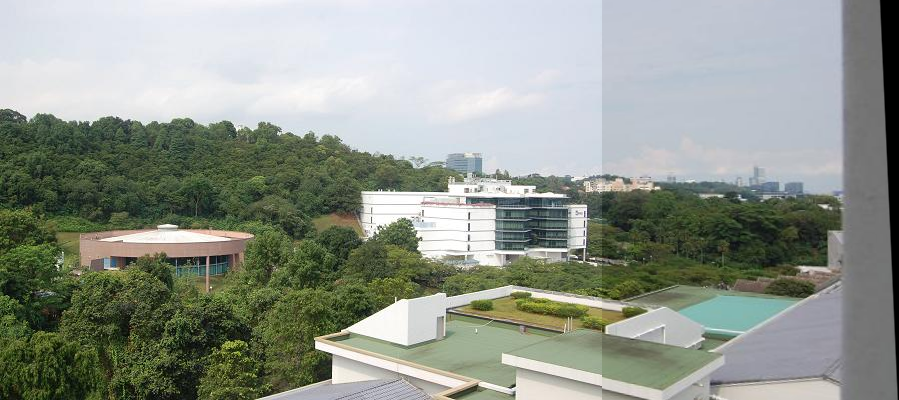

In [ ]:
stitch_imgxy,H,_,_ = stitcher (img2,img3)
cv2_imshow(stitch_imgxy)

In [ ]:
def transform(src_pts, H):
    # src = [src_pts 1]
    # H = H/H[-1,-1]
    src = np.pad(src_pts, [(0, 0), (0, 1)], constant_values=1)
    # pts = H * src
    pts = np.dot(H, src.T).T
    # normalize and throw z=1
    pts = (pts / pts[:, 2].reshape(-1, 1))[:, 0:2]
    return pts
# img = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
height,width,_=img1.shape
idx_pts = np.mgrid[0:width, 0:height].reshape(2, -1).T
map_pts = transform(idx_pts, (H))
map_pts = np.asarray(map_pts)
map_pts = map_pts.reshape((width, height, 2)).astype(np.float32)
# np.reshape()
comb_img = np.zeros((height*2,width*2,3))
warped = cv2.remap(img1, map_pts, None, cv2.INTER_CUBIC).transpose(1, 0, 2)
h1,w1,_ = img1.shape
# comb_img[:h1,:w1] = img2
# comb_img[]
# cv2_imshow(comb_img)
cv2_imshow(warped)

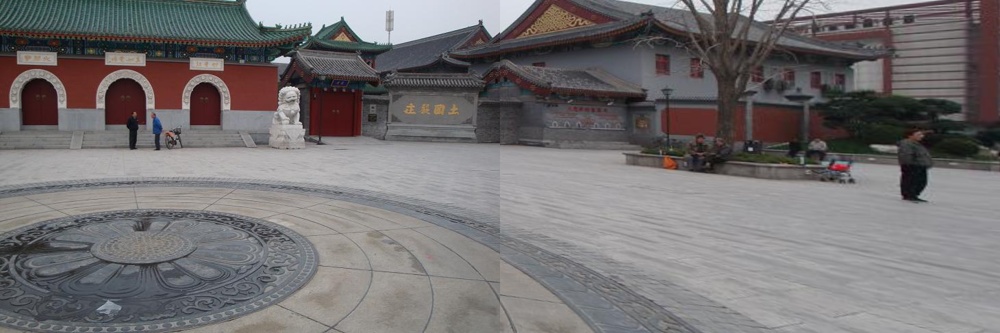

In [ ]:
# warped_image1 = cv2.warpPerspective(img1,H_inv,(w1+w2,h1))

gray = cv2.cvtColor(image.astype(np.float32), cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]
thresh = thresh.astype(np.uint8)
# Finds contours from the binary image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

# get the maximum contour area
c = max(cnts, key=cv2.contourArea)

# get a bbox from the contour area
(x, y, w, h) = cv2.boundingRect(c)

# crop the image to the bbox coordinates
image2 = image[y:y + h, x:x + w]

cv2_imshow(image2)

#References
---
TowardsDataScience - [link](https://towardsdatascience.com/image-panorama-stitching-with-opencv-2402bde6b46c)

Medium.com - [link](https://medium.com/analytics-vidhya/image-stitching-with-opencv-and-python-1ebd9e0a6d78)

StackOverFlow - [link](https://stackoverflow.com/questions/61146241/how-to-stitch-two-images-using-homography-matrix-in-opencv)